# Shareholder Voter Model

In this experiment we look at a minimal voter model that incorporates the most basic network effects described in[1]. 





[1]
<center><h3>Institutional Investor Voting Behavior: A Network Theory Perspective</h3></center>

<center><h4>Luca Enriques$^1$, Alessandro Romano$^2$</h4></center>

<center><i>ECGI Working Paper Series in Law</i></center>
<center><small>1. University of Oxford and ECGI 2. Yale University </small></center>


# Model Description

We have $V$ shareholders who are about to cast their vote *for* or *against* a proposition. The outcome is decided by majority rule. As a shorthand we use the notation $\left\{-1,+1\right\}$ to denote against- or for the proposition when describing a vote or the intended vote (opinion) held at a time *before* the vote. Then $V^\mathbb{1}_t$ denotes all voters that are at time $t$ of the opinion to vote for the proposition. 

In this model, the set of voters $V$ comprises the core shareholders $C = (C^\mathbb{-1}, C^\mathbb{1})$ who will not change their opinions and the floating voters $F$. 

\begin{equation}\tag{voters}
V = C \cup F
\end{equation}

With each voter $v \in V$ is associated the number of shares $w_v$ they hold. So far we do not include non-voting shares, and to simplify this first experiment each voter has only one voting share.

We note here that with the floating voters we want to model institutional investors in particular. 


## Network Structure

The voters $V$ are connected to others and we envision there are multiple possible types of interaction. We want to use data analysis to reconstruct the different layers of this network. In this first experiment we use a simple single-layer network. Let $E$ denote the set of connected voter pairs $(v, v')$.

\begin{equation}\tag{Network}
G(V,E)
\end{equation}





##  Informed voting

Investors may purchase investment advice.  Institutional investors aim to achieve competitive advantage over competitors. If the estimated competitive benefit $b$ per share is less than the cost of purchasing information, the investor will not purchase information. 
\begin{equation}\tag{[1], page 12}
c \geq w b
\end{equation}

If there is a potential benefit to purchasing information at price $c$, then $c \leq w b$. Investors are reticent in case their relative size (number of shares held) is small:

\begin{equation}\tag{relative size}
I = \frac{\sum_{v'\in N(v)}w_{v'}}{w_v + \sum_{v'\in N(v)}w_{v'}}
\end{equation}


Let $P(v)$ denote whether or not voter $v$ purchases information.

\begin{equation}\tag{reticence}
R = \frac{\sum_{v'\in N(v)}P(v')}{|N(v)|}
\end{equation}


So the final decision for the voters becomes:

\begin{equation}
  \begin{cases}
\neg P(v) &: c \geq w b\\
Pr\left\{P(v) \right\} = (1-I\cdot R) &: c < w b \\
\end{cases}
\end{equation}

So that in the case there is a potential benefit to purchasing the information, the decision is probabilistic and becomes more likely the larger the size of the agent compared to its peers and more likely if fewer peers *also* purchase information.

## Activists 

Additionally, an activist shareholder may want to influence the voting process. The activist stands to gain some benefit to swinging the vote one way or the other, so the activist has a limited amount of capital to purchase votes (strictly less than its possible benefits). 


For the investors, selling a vote has a monetary benefit 

If a voter $v$ knows that many of its peers $N(v)$ have sold their rights, $v$ will want to do this as well: because many of its peers will vote one way, the voter $v$ now has a small chance of tipping the vote in the other direction. Therefore, it would be better off selling its vote too, and at least achieve the monetary benefit. Much like (P), we use the notation $S(v)$ to say $v$ has sold its vote. Complementary to information purchasing, the voters become more eager to 

\begin{equation}\tag{eagerness}
S = \frac{\sum_{v'\in N(v)}S(v')}{|N(v)|}
\end{equation}

So the final decision for the voters becomes:

\begin{equation}
Pr\left\{S(v) \right\} = I\cdot S
\end{equation}


## Voter Network Effects

If our voter $v$ does not commit to either the purchase of information or sell its voting rights, the voters may be influenced by its neighbours. This is simulated using the classical voter model in which during each timestep a voter is randomly selected and may adopt the opinion of one of its neighbours.


# Outcomes of Initial Experimentation

The model displays complex dynamics. A forecast about the outcome of the vote under specific conditions is not a matter of a single (mechanistic) realisation, rather it requires a computational approach wherein the forecast is a function of many different realisation and provide confidence bounds (Monte Carlo methods).


# Research Goals

* How can the activist influence the outcome of the vote? 

We consider the options to purchase votes of specific shareholders, the option to start an information campaign in order to convice a large group of shareholders at once (without the guarantee of a purchased vote). 

* With finite capital, how can it achieve the best chances of sucess? 

We propose to use large scale computation to gain intuition as to which voters are the best targets for influencing.

* How should the activist use information about the network to improve its chances of success? 

We hypothesise the properties of the network (such as the degree of $v$, $v$'s centrality in the network, the connectedness of the network) play a role in this.




# Experiment 1. 

We look at the dynamics of a single instance of the model, and visualise the network to show that 

$|V| = 20$

initial propensity = 70% for the proposition

In [18]:
%%opts Graph [color_index='opinion' tools=['hover'] width=600 height=400](cmap='RdYlGn')
%%opts Curve [tools=['hover'] width=600 height=200] {+framewise}

hmap = hv.HoloMap({t: animate(t) for t in range(1,1000,10)},
           kdims='time').redim.range(x=(-1.2, 1.2), y=(-1.2, 1.2)).collate()

In [19]:
renderer = hv.renderer('bokeh')
renderer.save(hmap, 'experiment1')

In [21]:
hmap

:Layout
   .Graph.I :HoloMap   [time]
      :Graph   [start,end]
   .Curve.I :HoloMap   [time]
      :Curve   [time]   (y)

# Experiment 2. 

For the same parameters, we perform a Monte Carlo simulation with 100 samples. 

In [22]:
%%opts Overlay [show_legend=True width=800 height=600]
%%opts Spread [show_legend=True show_title=True tools=['hover']]
agg = ds.aggregate('time', np.mean, spreadfn=np.std)
hspread = (hv.Spread(agg) * hv.Curve(agg)(plot=dict(show_grid=True))).redim.range(opinion=((-1, 1)), time=((0,I)))

In [23]:
renderer = hv.renderer('bokeh')
renderer.save(hspread, 'experiment2')

In [24]:
hspread

:Overlay
   .Spread.I :Spread   [time]   (opinion,opinion_std)
   .Curve.I  :Curve   [time]   (opinion,opinion_std)

# Experiment 3. 

Parameter space exploration for the activist fund.

In [28]:
%%opts Curve [tools=['hover'] width=600 height=400] 
%%opts Spread [tools=['hover'] width=600 height=400] 

hcmap = hv.HoloMap({ (p,c,cap): costly_model(p,c,cap) 
             for p in [0.1,0.25,0.50,0.75,0.9]
             for c in [0.1,0.25,0.50,0.75,0.9]
             for cap in [1,2,3,5,10]
           },
           kdims=[ 'initial propensity'
                 , 'information cost'
                 , 'activist capital'
                 ]).redim.range(x=(-1.2, 1.2), y=(-1.2, 1.2))


In [29]:
renderer = hv.renderer('bokeh')
renderer.save(hcmap, 'experiment3')

In [30]:
hcmap

:HoloMap   [initial propensity,information cost,activist capital]
   :Overlay
      .Spread.I :Spread   [time]   (opinion,opinion_std)
      .Curve.I  :Curve   [time]   (opinion,opinion_std)

# Python 3.6
holoviews with latest patch to import networkx attributes

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
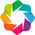

In [1]:
import random            
import numpy             as np
import pandas            as pd
import networkx          as nx
import holoviews         as hv

import matplotlib.pyplot as plt

hv.extension('bokeh')

In [2]:
%load_ext cython

In [3]:
%%cython
from __main__ import *

class Agent:
    def __init__(self, contacts):
        self.contacts = contacts

        
class Voter(Agent):
    def __init__( self, identifier, influenceability, contacts, shares=1, opinion=0):
        super().__init__(contacts)
        self.identifier       = identifier
        self.influenceability = influenceability
        self.opinion          = opinion
        self.benefit          = np.random.random()
        self.shares           = shares
        self.bought_info      = False
        
        
class InformationProvider(Agent):
    def __init__(self, opinion, capital=10, cost=0.5, contacts=[]):
        super().__init__(contacts)
        self.capital          = capital
        self.opinion          = opinion
        self.cost             = cost #np.random.random() # priced charged to other agents for info

In [20]:
%%cython
from __main__ import *

def simulate( V 
            , G
            , P       = 0.99
            , NFO     = [1]
            , core    = (0,0)
            , I       = 1000
            , C       = 0.9
            , IC      = 0.5
            , capital = 10
            , seed    = 0 ):
    random.seed(seed)
    np.random.seed(seed)
    voters = []

    informationproviders = []
    for n in NFO:
        informationproviders.append(InformationProvider( opinion=n
                                                       , capital=capital
                                                       , cost=IC
                                                       , contacts=[]))
    for v in range(V):
        voters.append(Voter(v, C, []))

    for v in range(core[0]):
        voters[v].opinion = 0
        voters[v].influenceability = 0
        
    for v in range(core[1]):
        voters[core[0] + v].opinion = 1
        voters[core[0] + v].influenceability = 0
        
    for s,t in G.edges():
        voters[s].contacts.append(t)
        voters[t].contacts.append(s)

    for v in range(core[0] + core[1], V):
        voters[v].opinion = 1 if np.random.random() < P else 0

    live = set(range(V))
    def is_live(v, voters):
        return not all(list(map(lambda c: voters[c].opinion == voters[v].opinion, voters[v].contacts)))
    
    for v in range(V):
        if not is_live(v, voters):
            live.remove(v)
            
    opinions = np.full((I,V), np.nan)
    for i in range(I):
        for v in range(V):
            opinions[i, v] = voters[v].opinion
        if 0 == len(live):
            break
        t = np.random.choice(list(live)) # np.random.randint(V) 
        if t < core[0] + core[1]:
            continue
        if 0 == voters[t].influenceability:
            continue
        voters[t].influenceability *= 0.999
            
        if 0 == len(voters[t].contacts):
            continue
            
        voters[t].bought_info = False
        if (voters[t].benefit * voters[t].shares > informationproviders[0].cost and 
            informationproviders[0].capital > 0 ):    
            neighbourhood = sum(map(lambda n: voters[n].shares, voters[t].contacts))
            relative_w = voters[t].shares / neighbourhood
            other_purchasers = sum(map(lambda n: voters[n].bought_info, voters[t].contacts))            
            relative_b = other_purchasers / len(voters[t].contacts)
            if np.random.random() <= (1 - relative_w *  relative_b):
                informationproviders[0].capital -= informationproviders[0].cost
                voters[t].bought_info = True
                
        
        if voters[t].bought_info:
            voters[t].opinion = informationproviders[0].opinion  
            voters[t].influenceability = 0
            
            for c in voters[t].contacts:
                if voters[s].opinion != voters[c].opinion:
                    live.add(c)

            if not is_live(t, voters): 
                live.remove(t)
        else: 
            s = np.random.choice(voters[t].contacts)
            if np.random.random() < voters[t].influenceability:
                for c in voters[t].contacts:
                    if voters[s].opinion != voters[c].opinion:
                        live.add(c)
                voters[t].opinion = voters[s].opinion
                if not is_live(t, voters): 
                    live.remove(t)
    return voters, opinions

In [5]:
# Exp 1

In [6]:
V                     = 50
core                  = (3,3) # 5 for, 5 against
floating_voters       = V - sum(core)
information_providers = [0]   # one provider with opinion -1

G = nx.powerlaw_cluster_graph(V, 5, 0.05, seed=0)  #nx.erdos_renyi_graph(V, 0.3, seed=0)
P = 0.7
C = 0.9
I = 2000
S = 1000

traces = np.full((S,I), np.nan)

for s in range(S):
    voters, opinions = simulate(V, G, P, information_providers,core ,I,C,IC=10,capital=-1, seed=s)
    ratios =  opinions.sum(axis=1) / V
    traces[s,:] = ratios

In [7]:
# for plotting only
traces = np.nan_to_num(traces) * 2 - 1
ds = hv.Dataset((np.arange(I), np.arange(S), traces), ['time', 'sample'], 'opinion')

In [8]:
# Exp 2

In [9]:
%%opts Graph [color_index='opinion' tools=['hover'] width=600 height=400](cmap='RdYlGn')
%%opts Curve [tools=['hover'] width=600 height=200] {+framewise}

def animate(T):
    V = 20
    core                  = (1,1) 
    G = nx.powerlaw_cluster_graph(V, 5, 0.05, seed=0) 
    P = 0.7
    C = 0.9
    informationcost = 0.5
    capital = 10
    information_providers = [0]
    
    voters, opinions = simulate( V, G, P, information_providers
                                   ,core ,T+1,C, IC=informationcost, capital=capital, seed=0)
    ratios =  opinions.sum(axis=1) / V

    random.seed(0)
    np.random.seed(0)
    padding = dict(x=(-1.2, 1.2), y=(-1.2, 1.2))
    
    for v in range(V):
        G.nodes[v]['opinion'] = opinions[T, v]
    
    simple_graph = hv.Graph.from_networkx(G, nx.layout.nx.spring_layout, iterations=1000).redim.range(**padding)
    return (simple_graph + (hv.Curve(ratios*2-1, kdims=['time']).redim.range(time=((1, 1000))) )).cols(1)


In [10]:
#Exp 3

In [25]:
%%opts Overlay [show_legend=False width=600 height=460]

def costly_model( propensity 
                , informationcost
                , capital
                ):    
    V                     = 20
    core                  = (1,1) # 5 for, 5 against
    floating_voters       = V - sum(core)
    information_providers = [0]   # one provider with opinion 1

    G = nx.erdos_renyi_graph(V, 0.3, seed=0) # nx.powerlaw_cluster_graph(V, 5, 0.05, seed=0) 
    P = propensity
    C = 0.9
    I = 1000
    S = 33

    traces = np.full((S,I), np.nan)

    for s in range(S):
        voters, opinions = simulate( V, G, P, information_providers
                                   ,core ,I,C, IC=informationcost, capital=capital, seed=s)
        ratios =  opinions.sum(axis=1) / V
        traces[s,:] = ratios

    traces = np.nan_to_num(traces)*2 -1

    ds = hv.Dataset((np.arange(I), np.arange(S), traces), ['time', 'sample'], 'opinion')
    agg = ds.aggregate('time', np.mean, spreadfn=np.std)
    return (hv.Spread(agg) * hv.Curve(agg)).redim.range(opinion=((-1, 1)), time=((0,I)))
